In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
import seaborn as sns
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import Dense
import heartpy as hp
from datetime import datetime as dt
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from sklearn.preprocessing import LabelEncoder
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import numpy as np
from biosppy.signals import ecg
from ecgdetectors import Detectors # pip3 install py-ecg-detectors
from hrv import HRV
import neurokit as nk
from biosppy.signals.eda import eda
from pysiology import electrodermalactivity


Bad key "text.dvipnghack" on line 127 in
/home/pyf/.local/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.2.1/matplotlibrc.template
or from the matplotlib source distribution

Bad key "nbagg.transparent" on line 433 in
/home/pyf/.local/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.2.1/matplotlibrc.template
or from the matplotlib source distribution

Bad key "animation.mencoder_path" on line 516 in
/home/pyf/.local/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.2.1/matplotlibrc.template
or from the matplotlib source distribution

Bad key "animation.mencoder_args" on l

Thank you for using Pysiology. If you use it in your work, please cite:
Gabrieli G., Azhari A., Esposito G. (2020) PySiology: A Python Package for Physiological Feature Extraction. In: Esposito A., Faundez-Zanuy M., Morabito F., Pasero E. (eds) Neural Approaches to Dynamics of Signal Exchanges. Smart Innovation, Systems and Technologies, vol 151. Springer, Singapore


# Getting Db

The time interval of reading sensor data is 2 ms.

In [2]:
df = pd.read_csv('ds01.csv')
df = df.loc[df['Driver']!='05', :]
df.head()

,Elapsed time,Driver,ECG,EMG,foot GSR,hand GSR,HR,marker,RESP
4960,'0:00.000',06,-0.048,0.124,9.051,19.072,90.0,12.36,39.97
4961,'0:00.002',06,-0.052,0.124,9.051,19.072,90.0,12.36,39.97
4962,'0:00.004',06,-0.057,0.124,9.051,19.072,90.0,12.36,39.97
4963,'0:00.006',06,-0.063,0.124,9.051,19.072,90.0,12.36,39.97
4964,'0:00.008',06,-0.067,0.124,9.051,19.072,90.0,12.36,39.97


In [3]:
df['Driver'].value_counts()

08     4960
06     4960
16     4960
09     4960
07     4960
17b    4960
11     4960
10     4960
17a    4800
12     3565
Name: Driver, dtype: int64

In [4]:
df.describe()

,ECG,EMG,foot GSR,hand GSR,HR,marker,RESP
count,48045.000000,48045.00000,48045.000000,48045.000000,48045.000000,48045.000000,48045.000000
mean,-0.040043,0.27814,5.632181,8.528000,78.035800,11.370538,41.864287
std,0.252633,0.23280,2.834947,5.321553,11.132845,1.971198,5.805065
min,-1.273000,0.01300,1.342000,2.618000,54.000000,8.880000,34.000000
25%,-0.118000,0.16600,2.456000,4.860000,69.000000,10.050000,36.500000
50%,-0.067000,0.22800,6.103000,6.366000,80.000000,11.160000,39.790000
75%,0.017000,0.33100,7.637000,11.592000,86.000000,11.570000,47.590000
max,2.050000,3.77100,18.709000,19.154000,109.000000,16.640000,53.750000


# Cleaning the data (acc. to the thesis)

- [x] Removing ECG's outliers and cleaning it. 
- [x] Removing -ve GSR readings by multiplying by -1
- [ ] After visual analysis of the “post-stress” period (i.e. the resting period after driving) it was decided to remove this part since the signals look like a mix between the pre-driving rest period and the driving session. This kind of contradictory data would give the classifier a hard time.
- [x] GSR Turns to zero bc. sensor problem. The precedent value is taken in that case.
- [x] Converting marker to binary (pg 37, thesis)

## Converting marker to binary (-1 & +1)

* Plotting 'marker' to see the peaks. These peeks will help convert continuour 'marker' into binary stress and non stress feature. 
* Enhancing the marker to have better visibility of the peak.

In [5]:
# Helper functions:
def drawG(dr):
    sample_marker = df.loc[df['Driver'] == dr, 'marker' ]
    enhanced = hp.enhance_peaks(sample_marker, iterations=4)
    dif = sample_marker.abs()
    print(len(sample_marker))
    print(len(dif))
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=sample_marker.index, y=enhanced,
                        mode='lines',
                        name='Difference', 
                        line_color='rgba(255,0,0, 1)')
                 )
    # fig.update_layout(linecolor='rgb(0, 0, 0)')
    fig.show()
    
def add_stress(df, middle, curr, nxt):
    start = df.loc[df['Driver']==curr, :].index[0]
    end = df.loc[df['Driver'] == nxt, :].index[0] - 1
    df['stress'][start: middle] = -1
    df['stress'][middle:end] = 1
    return df

In [6]:
df['stress'] = [0 for _ in range(len(df))]
df.head()

,Elapsed time,Driver,ECG,EMG,foot GSR,hand GSR,HR,marker,RESP,stress
4960,'0:00.000',06,-0.048,0.124,9.051,19.072,90.0,12.36,39.97,0
4961,'0:00.002',06,-0.052,0.124,9.051,19.072,90.0,12.36,39.97,0
4962,'0:00.004',06,-0.057,0.124,9.051,19.072,90.0,12.36,39.97,0
4963,'0:00.006',06,-0.063,0.124,9.051,19.072,90.0,12.36,39.97,0
4964,'0:00.008',06,-0.067,0.124,9.051,19.072,90.0,12.36,39.97,0


### Stress starting range for various drivers:

In [7]:
drawG('08')

4960
4960


### +1 stress int - end:
From the reading of the graphs (of markers) of these drivers, the **initial period is resting (not stress or -1)** and **the later is stress (+1)**. The key represents the drive id and the value represents the index where the peak was observed. The peak represents the change in the state. <br>
{ '11' :33248, '16':39149, '09': 23232, '17a': 46541, '12': 36445}

### +1 stress start - int:
From the reading of the graphs (of markers) of these drivers, **the initial period is stressful (stress or 1)** and the **later is not stress (-1)**. The key represents the drive id and the value represents the index where the peak was observed. The peak represents the change in the state. <br>
{ '06': 7424, '07': 13023, '17b': 48077, '10': 26272, '08': 16224 }

In [8]:
dc_int_end = { '11' :33248, '16':39149, '09': 23232, '17a': 46541, '12': 36445}
dc_start_int = { '06': 7424, '07': 13023, '17b': 48077, '10': 26272, '08': 16224 }

# For drivers where the initial period was stress-free (the first dict in the above cell)
for k in dc_int_end.keys():
    dr = k
    middle = dc_int_end[dr]
    start = df.loc[df['Driver']==dr, :].index[0]
    end = df.loc[df['Driver']==dr, :].index[-1]
    df.loc[start: middle, 'stress'] = -1
    df.loc[middle: end, 'stress'] = 1
    
    
for k in dc_start_int.keys():
    dr = k
    middle = dc_start_int[dr]
    start = df.loc[df['Driver']==dr, :].index[0]
    end = df.loc[df['Driver']==dr, :].index[-1]
    df.loc[start: middle, 'stress'] = 1
    df.loc[middle: end, 'stress'] = -1
    
    
df['stress'].sum()

-10255

In [9]:
df.head()

,Elapsed time,Driver,ECG,EMG,foot GSR,hand GSR,HR,marker,RESP,stress
4960,'0:00.000',06,-0.048,0.124,9.051,19.072,90.0,12.36,39.97,1
4961,'0:00.002',06,-0.052,0.124,9.051,19.072,90.0,12.36,39.97,1
4962,'0:00.004',06,-0.057,0.124,9.051,19.072,90.0,12.36,39.97,1
4963,'0:00.006',06,-0.063,0.124,9.051,19.072,90.0,12.36,39.97,1
4964,'0:00.008',06,-0.067,0.124,9.051,19.072,90.0,12.36,39.97,1


In [10]:
df.describe()

,ECG,EMG,foot GSR,hand GSR,HR,marker,RESP,stress
count,48045.000000,48045.00000,48045.000000,48045.000000,48045.000000,48045.000000,48045.000000,48045.000000
mean,-0.040043,0.27814,5.632181,8.528000,78.035800,11.370538,41.864287,-0.213446
std,0.252633,0.23280,2.834947,5.321553,11.132845,1.971198,5.805065,0.976965
min,-1.273000,0.01300,1.342000,2.618000,54.000000,8.880000,34.000000,-1.000000
25%,-0.118000,0.16600,2.456000,4.860000,69.000000,10.050000,36.500000,-1.000000
50%,-0.067000,0.22800,6.103000,6.366000,80.000000,11.160000,39.790000,-1.000000
75%,0.017000,0.33100,7.637000,11.592000,86.000000,11.570000,47.590000,1.000000
max,2.050000,3.77100,18.709000,19.154000,109.000000,16.640000,53.750000,1.000000


# Testing bare model: 

In [11]:
X = df.loc[:, ['ECG', 'EMG', 'foot GSR', 'hand GSR', 'HR', 'RESP']]
y = df['stress']
print(len(X))
len(y)
encoder = LabelEncoder()
encoder.fit(y)
encoded_Y = encoder.transform(y)

48045


In [12]:
def make_model(input_shape = 6):
    model = Sequential()
    model.add(Dense(16, input_dim=input_shape, activation='relu'))
    model.add(Dense(32, activation = 'relu'))
    # model.add(Dense(64, activation = 'relu'))
    # model.add(Dense(64, activation = 'relu'))
    # model.add(Dense(32, activation = 'relu'))
    # model.add(Dense(16, activation = 'relu'))
    model.add(Dense(1, activation='sigmoid'))
    # Compile model. We use the the logarithmic loss function, and the Adam gradient optimizer.
    model.compile(loss='binary_crossentropy', optimizer='adam' ,metrics=['accuracy'])
    model.summary()
    return model

model = make_model()

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 16)                112       
_________________________________________________________________
dense_2 (Dense)              (None, 32)                544       
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 33        
Total params: 689
Trainable params: 689
Non-trainable params: 0
_________________________________________________________________


In [13]:
model.fit(X, encoded_Y, epochs = 10, validation_split = 0.2, )


Train on 38436 samples, validate on 9609 samples
Epoch 1/10
38436/38436 [==============================] - 3s 72us/step - loss: 0.6290 - accuracy: 0.6557 - val_loss: 0.6521 - val_accuracy: 0.6506
Epoch 2/10
38436/38436 [==============================] - 3s 67us/step - loss: 0.5498 - accuracy: 0.7294 - val_loss: 0.6444 - val_accuracy: 0.6871
Epoch 3/10
38436/38436 [==============================] - 3s 65us/step - loss: 0.5182 - accuracy: 0.7451 - val_loss: 0.7498 - val_accuracy: 0.5291
Epoch 4/10
38436/38436 [==============================] - 3s 66us/step - loss: 0.5028 - accuracy: 0.7545 - val_loss: 0.6914 - val_accuracy: 0.6536
Epoch 5/10
38436/38436 [==============================] - 3s 66us/step - loss: 0.4826 - accuracy: 0.7643 - val_loss: 0.7392 - val_accuracy: 0.6413
Epoch 6/10
38436/38436 [==============================] - 3s 66us/step - loss: 0.4723 - accuracy: 0.7687 - val_loss: 0.7733 - val_accuracy: 0.5842
Epoch 7/10
38436/38436 [==============================] - 3s 69us/st

# Feature engineering and data preprocessing acc to the research paper (Azar) 

### Data preprocessing:

* [X] Removing noice from ECG
* [X] Converting marker into binary stress (according to thesis and not acc. to Azar)

**Removing Noise from ECG**

In [14]:
before = list(df['ECG'])
drivers = df['Driver'].value_counts()
for dr in drivers.index:
    after = ecg.ecg(signal = df.loc[df['Driver']== dr, 'ECG'], sampling_rate = 500, show = False)
    df.loc[df['Driver']== dr, 'ECG'] = after[1]
    
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index, y=df['ECG'],
                    mode='lines',
                    name='Filtered ECG', 
                    line_color='rgba(0,255,0, 1)')
             )
# fig.update_layout(linecolor='rgb(0, 0, 0)')
fig.add_trace(go.Scatter(x=df.index, y=before,
                    mode='lines',
                    name='Raw ECG', 
                    line_color='rgba(255,0,0, 1)')
             )
# fig.update_layout(linecolor='rgb(0, 0, 0)')
fig.show()

#### Testing model performance after filtering ECG:

In [15]:
X = df.loc[:, ['ECG', 'EMG', 'foot GSR', 'hand GSR', 'HR', 'RESP']]
y = df['stress']
encoder = LabelEncoder()
encoder.fit(y)
encoded_Y = encoder.transform(y)
trainX, testX, trainy, testy = train_test_split(X, encoded_Y, test_size = 0.2 )
model_ecg_filtered = make_model()
model_ecg_filtered.fit(trainX, trainy, epochs = 10, validation_split = 0.2)
op = model_ecg_filtered.evaluate(testX, testy)
print("Test Accuracy=", op[1]*100, '%')
print("Test Loss=", op[0])

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 16)                112       
_________________________________________________________________
dense_5 (Dense)              (None, 32)                544       
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 33        
Total params: 689
Trainable params: 689
Non-trainable params: 0
_________________________________________________________________
Train on 30748 samples, validate on 7688 samples
Epoch 1/10
30748/30748 [==============================] - 2s 80us/step - loss: 0.6854 - accuracy: 0.6252 - val_loss: 0.6464 - val_accuracy: 0.6730
Epoch 2/10
30748/30748 [==============================] - 2s 64us/step - loss: 0.6346 - accuracy: 0.6650 - val_loss: 0.6123 - val_accuracy: 0.6968
Epoch 3/10
30748/30748 [===================

After removing noise from ECG, accuracy hiked by approx 20% 

**Following features are calculated from ECG**
* [x] RMSSD - Root mean square of the Inter-beat (RR) Intervals (the time intervals between consecutive heart beats)
* [x] meanNN - Mean RR interval
* [x] sdNN - SD of RR interval
* [x] cvNN - Coefficient of Variation (CV), i.e. the ratio of sdNN divided by meanNN
* [x] CVSD - Coefficient of variation of successive differences, i.e. the RMSSD divided by meanNN
* [x] medianNN - Median of the absolute values of the successive differences between the RR intervals
* [x] madNN - Median Absolute Deviation (MAD) of the RR intervals
* [x] mcvNN - Median-based Coefficient of Variation (MCV), i.e. the ratio of madNN divided by medianNN
* [x] pNN20 - The number of interval differences of successive RR intervals greater than 20 ms divided by the total number of RR intervals
* [x] pNN50 - The number of interval differences of successive RR intervals greater than 50 ms divided by the total number of RR intervals

In [16]:
# Starting the index of dataframe from 0.
df.reset_index(inplace=True)
df.drop('index', axis = 1, inplace=True)
df.head()

,Elapsed time,Driver,ECG,EMG,foot GSR,hand GSR,HR,marker,RESP,stress
0,'0:00.000',06,-0.002029,0.124,9.051,19.072,90.0,12.36,39.97,1
1,'0:00.002',06,-0.005351,0.124,9.051,19.072,90.0,12.36,39.97,1
2,'0:00.004',06,-0.008661,0.124,9.051,19.072,90.0,12.36,39.97,1
3,'0:00.006',06,-0.011926,0.124,9.051,19.072,90.0,12.36,39.97,1
4,'0:00.008',06,-0.015088,0.124,9.051,19.072,90.0,12.36,39.97,1


In [17]:
# Source: https://github.com/berndporr/py-ecg-detectors/blob/master/usage_example.py
fs = 500 # Frequency
detectors = Detectors(fs)
r_peaks = detectors.engzee_detector(df['ECG'])

fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index, y=df['ECG'],
                    mode='lines',
                    name='ECG', 
                    line_color='rgba(255,0,0, 0.75)')
             )


fig.add_trace(go.Scatter(x=r_peaks, y=df.loc[r_peaks, 'ECG'],
                    mode='markers',
                    name='R Peaks', 
                    line_color='rgba(0,0,0, 1)')
             )



fig.show()

Above is a plot of the R peak detected from ECG.

#### Calculating RMSSD

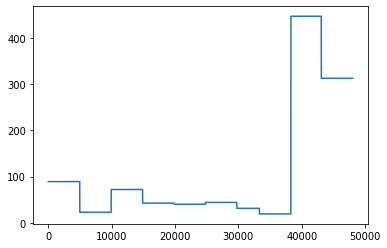

In [18]:
# Calculating RMSSD for each driver:
# NOTE: RMSSD IS NOT NORMALIZED.
df['RMSSD'] = [0 for _ in range(len(df))]
rp = pd.Series(r_peaks)
hrv_obj = HRV(500)
for dr in drivers.index:
    start = df.loc[df['Driver']==dr].index[0]
    end = df.loc[df['Driver']==dr].index[-1]
    RMSSD = hrv_obj.RMSSD(rp[(rp>start) & (rp<end)], normalise = False)
    df.loc[df['Driver']==dr, 'RMSSD'] = RMSSD
    
df.describe()
df['RMSSD'].plot()

#### Calculating meanNN, sdNN, cvNN, CVSD, medianNN, mcvNN, pNN20, pNN50
All the time and frequency domain features (as given in the paper) are extracted from ECG.

In [19]:
drivers = df['Driver'].value_counts().index

df['meanNN'] = [0 for _ in range(len(df))]
df['sdNN'] = [0 for _ in range(len(df))]
df['cvNN'] = [0 for _ in range(len(df))]
df['CVSD'] = [0 for _ in range(len(df))]
df['medianNN'] = [0 for _ in range(len(df))]
df['madNN'] = [0 for _ in range(len(df))]
df['mcvNN'] = [0 for _ in range(len(df))]
df['pNN20'] = [0 for _ in range(len(df))]
df['pNN50'] = [0 for _ in range(len(df))]


for dr in drivers:
    start = df.loc[df['Driver']==dr].index[0]
    end = df.loc[df['Driver']==dr].index[-1]
    crop = rp[(rp>start) & (rp<end)].diff()
    rmssd = df.loc[start, 'RMSSD']
    meanNN = crop.mean()
    df.loc[df['Driver']==dr, 'meanNN'] = meanNN
    std = crop.std()
    df.loc[df['Driver']==dr, 'sdNN'] = std
    cvNN = std/meanNN
    df.loc[df['Driver']==dr, 'cvNN'] = cvNN
    cvsd = rmssd/meanNN
    df.loc[df['Driver']==dr, 'CVSD'] = cvsd
    medianNN = crop.median()
    df.loc[df['Driver']==dr, 'medianNN'] = medianNN
    madNN = crop.mad()
    df.loc[df['Driver']==dr, 'madNN'] = madNN
    mcvNN = madNN / medianNN
    df.loc[df['Driver']==dr, 'mcvNN'] = mcvNN
    pNN20 = hrv_obj.pNN20(crop)
    df.loc[df['Driver']==dr, 'pNN20'] = pNN20
    pNN50 = hrv_obj.pNN50(crop)
    df.loc[df['Driver']==dr, 'pNN50'] = pNN50
    
    
df.describe()

,ECG,EMG,foot GSR,hand GSR,HR,marker,RESP,stress,RMSSD,meanNN,sdNN,cvNN,CVSD,medianNN,madNN,mcvNN,pNN20,pNN50
count,48045.000000,48045.00000,48045.000000,48045.000000,48045.000000,48045.000000,48045.000000,48045.000000,48045.000000,48045.000000,48045.000000,48045.000000,48045.000000,48045.000000,48045.000000,48045.000000,48045.000000,48045.000000
mean,-0.001793,0.27814,5.632181,8.528000,78.035800,11.370538,41.864287,-0.213446,113.218925,394.607851,44.442753,0.106800,0.266741,385.819232,30.077136,0.076879,0.559422,0.385544
std,0.162551,0.23280,2.834947,5.321553,11.132845,1.971198,5.805065,0.976965,138.892151,50.366459,46.410356,0.102763,0.307029,47.107624,26.778762,0.067098,0.090533,0.180823
min,-0.632589,0.01300,1.342000,2.618000,54.000000,8.880000,34.000000,-1.000000,19.078784,318.200000,9.080592,0.028537,0.056321,320.000000,8.053333,0.025167,0.416667,0.083333
25%,-0.041352,0.16600,2.456000,4.860000,69.000000,10.050000,36.500000,-1.000000,31.192948,344.083333,15.995659,0.042642,0.083157,338.500000,13.481481,0.036535,0.500000,0.333333
50%,-0.010267,0.22800,6.103000,6.366000,80.000000,11.160000,39.790000,-1.000000,44.015149,383.833333,21.590542,0.056250,0.110645,385.000000,17.430556,0.046358,0.583333,0.400000
75%,0.008064,0.33100,7.637000,11.592000,86.000000,11.570000,47.590000,1.000000,89.018895,448.400000,47.123548,0.136954,0.258713,437.000000,32.097222,0.094822,0.600000,0.500000
max,1.681256,3.77100,18.709000,19.154000,109.000000,16.640000,53.750000,1.000000,446.917343,457.100000,161.800426,0.367394,1.014799,458.000000,96.840000,0.250233,0.700000,0.700000


### Training NN model on features extracted from ECG

In [20]:
X = df.drop(['Elapsed time', 'Driver', 'marker', 'stress'], axis = 1)
y = df['stress']
X=(X-X.min())/(X.max()-X.min()) # Normalising to rescale all the features. 
encoder.fit(y)
encoded_Y = encoder.transform(y)
trainX, testX, trainy, testy = train_test_split(X, encoded_Y, test_size = 0.2 )

In [21]:
model_ecg_features = make_model(input_shape = 16)
model_ecg_features.fit(trainX, trainy, epochs = 40, validation_split = 0.2)
op = model_ecg_features.evaluate(testX, testy)
print("Test Accuracy=", op[1]*100, '%')
print("Test Loss=", op[0])

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_7 (Dense)              (None, 16)                272       
_________________________________________________________________
dense_8 (Dense)              (None, 32)                544       
_________________________________________________________________
dense_9 (Dense)              (None, 1)                 33        
Total params: 849
Trainable params: 849
Non-trainable params: 0
_________________________________________________________________
Train on 30748 samples, validate on 7688 samples
Epoch 1/40
30748/30748 [==============================] - 2s 81us/step - loss: 0.5747 - accuracy: 0.7019 - val_loss: 0.5409 - val_accuracy: 0.7328
Epoch 2/40
30748/30748 [==============================] - 2s 70us/step - loss: 0.5188 - accuracy: 0.7458 - val_loss: 0.5052 - val_accuracy: 0.7520
Epoch 3/40
30748/30748 [===================

**Following features are calculated from GSR**
> The GSR is recorded at 31Hz frequency.
* [x] meanGSR
* [x] meanSCL (skin conductance level. aka Tonic Electrodermial activity)
* [x] slopeSCL. diff between maxSCL and minSCL 
* [x] meanSCR (skin conductance response. aka phasic EDA)
* [x] maxSCR

In [23]:
# Trying how to process GSR (aka EDA)
temp = df.loc[df['Driver']=='06', 'hand GSR']
proc = nk.eda_process(temp, sampling_rate = 31)
idx = list(proc['df'].index)
# max(proc['df']['EDA_Phasic'])
fig = go.Figure()
fig.add_trace(go.Scatter(x=idx, y = proc['df']['EDA_Tonic'],
                    mode='lines',
                    name='SCL', 
                    line_color='rgba(255,0,0, 0.75)')
             )

fig.add_trace(go.Scatter(x=idx, y=proc['df']['EDA_Phasic'],
                     mode='lines',
                    name='SCR', 
                    line_color='rgba(0,0,0, 1)')
             )

fig.show()

In [24]:
drivers = df['Driver'].value_counts().index
df['foot meanGSR'] = [0 for _ in range(len(df))]
df['hand meanGSR'] = [0 for _ in range(len(df))]
df['foot meanSCR'] = [0 for _ in range(len(df))]
df['hand meanSCR'] = [0 for _ in range(len(df))]
df['foot maxSCR'] = [0 for _ in range(len(df))]
df['hand maxSCR'] = [0 for _ in range(len(df))]
df['foot meanSCL'] = [0 for _ in range(len(df))]
df['hand slopeSCL'] = [0 for _ in range(len(df))]
for dr in drivers:
    for var in ['foot', 'hand']:
        temp = df.loc[df['Driver']==dr, var+' GSR']
        meanGSR = temp.mean()
        df.loc[temp.index, var+' meanGSR'] = meanGSR
        processed_GSR = nk.eda_process(temp, sampling_rate = 31)
        meanSCL = processed_GSR['df']['EDA_Tonic'].mean()
        df.loc[temp.index, var+' meanSCL'] = meanSCL
        slopeSCL = max(processed_GSR['df']['EDA_Tonic']) - min(processed_GSR['df']['EDA_Tonic'])
        df.loc[temp.index, var+' slopeSCL'] = slopeSCL
        meanSCR = processed_GSR['df']['EDA_Phasic'].mean()
        df.loc[temp.index, var+' meanSCR'] = meanSCR
        maxSCR = max(processed_GSR['df']['EDA_Phasic'])
        df.loc[temp.index, var+' maxSCR'] = maxSCR
        
df

,Elapsed time,Driver,ECG,EMG,foot GSR,hand GSR,HR,marker,RESP,stress,...,foot meanGSR,hand meanGSR,foot meanSCR,hand meanSCR,foot maxSCR,hand maxSCR,foot meanSCL,hand slopeSCL,foot slopeSCL,hand meanSCL
0,'0:00.000',06,-0.002029,0.124,9.051,19.072,90.0,12.36,39.97,1,...,8.941716,18.961706,0.043065,0.074294,0.163574,0.349776,-0.043065,3.293266,3.554833,-0.074294
1,'0:00.002',06,-0.005351,0.124,9.051,19.072,90.0,12.36,39.97,1,...,8.941716,18.961706,0.043065,0.074294,0.163574,0.349776,-0.043065,3.293266,3.554833,-0.074294
2,'0:00.004',06,-0.008661,0.124,9.051,19.072,90.0,12.36,39.97,1,...,8.941716,18.961706,0.043065,0.074294,0.163574,0.349776,-0.043065,3.293266,3.554833,-0.074294
3,'0:00.006',06,-0.011926,0.124,9.051,19.072,90.0,12.36,39.97,1,...,8.941716,18.961706,0.043065,0.074294,0.163574,0.349776,-0.043065,3.293266,3.554833,-0.074294
4,'0:00.008',06,-0.015088,0.124,9.051,19.072,90.0,12.36,39.97,1,...,8.941716,18.961706,0.043065,0.074294,0.163574,0.349776,-0.043065,3.293266,3.554833,-0.074294
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48040,'0:09.990',17b,0.010904,0.124,5.322,8.557,63.0,10.15,37.48,-1,...,6.124052,9.708381,1.498511,1.443239,17.889627,17.018295,-1.498511,22.227988,23.371032,-1.443239
48041,'0:09.992',17b,0.006424,0.124,5.322,8.557,63.0,10.15,37.48,-1,...,6.124052,9.708381,1.498511,1.443239,17.889627,17.018295,-1.498511,22.227988,23.371032,-1.443239
48042,'0:09.994',17b,0.003188,0.124,5.322,8.557,63.0,10.15,37.48,-1,...,6.124052,9.708381,1.498511,1.443239,17.889627,17.018295,-1.498511,22.227988,23.371032,-1.443239
48043,'0:09.996',17b,0.000940,0.124,5.322,8.557,63.0,10.15,37.48,-1,...,6.124052,9.708381,1.498511,1.443239,17.889627,17.018295,-1.498511,22.227988,23.371032,-1.443239


In [ ]:
# Saving the dataframe here. If you're running for the first time, run this.
# df.to_csv('processedData.csv', index = False)

### Training NN on all the extracted features

In [25]:
X = df.drop(['Elapsed time', 'Driver', 'marker', 'stress'], axis = 1)
y = df['stress']
X=(X-X.min())/(X.max()-X.min()) # Normalising to rescale all the features. 
encoder.fit(y)
encoded_Y = encoder.transform(y)
trainX, testX, trainy, testy = train_test_split(X, encoded_Y, test_size = 0.2 )
num_features = len(X.columns)

In [26]:
def make_model_fullScale(input_shape):
    '''
    This architecture is the same architecture as proposed by Azar et al.
    '''
    model = Sequential()
    model.add(Dense(60, input_dim=input_shape, activation='relu'))
    model.add(Dense(60, activation = 'relu'))
    model.add(Dense(60, activation = 'relu'))
    model.add(Dense(60, activation = 'relu'))
    # model.add(Dense(32, activation = 'relu'))
    # model.add(Dense(16, activation = 'relu'))
    model.add(Dense(1, activation='sigmoid'))
    # Compile model. We use the the logarithmic loss function, and the Adam gradient optimizer.
    model.compile(loss='binary_crossentropy', optimizer='adam' ,metrics=['accuracy'])
    model.summary()
    return model

model_all_fratures = make_model_fullScale(input_shape = num_features)
model_all_fratures.fit(trainX, trainy, epochs = 125, validation_split = 0.2)
op = model_all_fratures.evaluate(testX, testy)
print("Test Accuracy=", op[1]*100, '%')
print("Test Loss=", op[0])

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_10 (Dense)             (None, 60)                1620      
_________________________________________________________________
dense_11 (Dense)             (None, 60)                3660      
_________________________________________________________________
dense_12 (Dense)             (None, 60)                3660      
_________________________________________________________________
dense_13 (Dense)             (None, 60)                3660      
_________________________________________________________________
dense_14 (Dense)             (None, 1)                 61        
Total params: 12,661
Trainable params: 12,661
Non-trainable params: 0
_________________________________________________________________
Train on 30748 samples, validate on 7688 samples
Epoch 1/75
30748/30748 [==============================] - 3s 98us/s

30748/30748 [==============================] - 3s 88us/step - loss: 0.1013 - accuracy: 0.9535 - val_loss: 0.0994 - val_accuracy: 0.9501
Epoch 50/75
30748/30748 [==============================] - 3s 87us/step - loss: 0.0981 - accuracy: 0.9550 - val_loss: 0.0788 - val_accuracy: 0.9598
Epoch 51/75
30748/30748 [==============================] - 3s 87us/step - loss: 0.0940 - accuracy: 0.9567 - val_loss: 0.1455 - val_accuracy: 0.9433
Epoch 52/75
30748/30748 [==============================] - 3s 88us/step - loss: 0.0924 - accuracy: 0.9567 - val_loss: 0.0871 - val_accuracy: 0.9618
Epoch 53/75
30748/30748 [==============================] - 3s 90us/step - loss: 0.0898 - accuracy: 0.9578 - val_loss: 0.1034 - val_accuracy: 0.9472
Epoch 54/75
30748/30748 [==============================] - 3s 91us/step - loss: 0.0928 - accuracy: 0.9569 - val_loss: 0.0798 - val_accuracy: 0.9598
Epoch 55/75
30748/30748 [==============================] - 3s 100us/step - loss: 0.1008 - accuracy: 0.9540 - val_loss: 0.137

In [29]:
op = model_all_fratures.evaluate(testX, testy)
print("Test Accuracy=", op[1]*100, '%')
print("Test Loss=", op[0])

9609/9609 [==============================] - 0s 34us/step
Test Accuracy= 97.11728692054749 %
Test Loss= 0.06847245065044297


### Experimenting with other ML classifiers:

In [30]:
clf = LogisticRegression(random_state=0).fit(trainX, trainy)
score_train = clf.score(trainX, trainy)
y_pred = clf.predict(testX)
print(f'Train Accuracy on Logistic Regression: {score_train*100}%')
score_test = accuracy_score(y_pred, testy)
print(f'Train Accuracy on Logistic Regression: {score_test*100}%')

Train Accuracy on Logistic Regression: 72.3150171714018%
Train Accuracy on Logistic Regression: 72.21354979706524%


/home/pyf/.local/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [31]:
clf_svm = SVC()
clf_svm.fit(trainX, trainy)
score_train = clf_svm.score(trainX, trainy)
y_pred = clf_svm.predict(testX)
print(f'Train Accuracy on SVM: {score_train*100} %')
score_test = accuracy_score(y_pred, testy)
print(f'Train Accuracy on SVM: {score_test*100} %')

Train Accuracy on SVM: 80.07076698928088 %
Train Accuracy on SVM: 80.13320845041108 %
